In [1]:
!pip install pytorch-ignite

In [2]:
import torch
import torchvision
import ignite

print(*map(lambda m: ": ".join((m.__name__, m.__version__)), (torch, torchvision, ignite)), sep="\n")

torch: 2.3.0
torchvision: 0.18.0
ignite: 0.5.0.post2


In [3]:
import os
import logging
import matplotlib.pyplot as plt

import numpy as np
from torchviz import make_dot
from torchsummary import summary

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader, Subset, random_split
from ignite.engine import Engine, Events
import ignite.distributed as idist

In [4]:
ignite.utils.manual_seed(999)

In [5]:
ignite.utils.setup_logger(name="ignite.distributed.auto.auto_dataloader", level=logging.WARNING)
ignite.utils.setup_logger(name="ignite.distributed.launcher.Parallel", level=logging.WARNING)

<Logger ignite.distributed.launcher.Parallel (WARNING)>

In [6]:
import os
import glob

# Define the directory path where files have been unzipped
directory_path = r'D:\Semester 4\Deep Learning\anime'

# List all files in the directory
all_files = glob.glob(os.path.join(directory_path, '**', '*'), recursive=True)

# Print all files
print("All files:")
for file in all_files:
    print(file)

# Select specific files (e.g., only JPEG images)
jpeg_files = glob.glob(os.path.join(directory_path, '**', '*.jpg'), recursive=True)

# Print selected JPEG files
print("\nSelected JPEG files:")
for file in jpeg_files:
    print(file)

All files:
D:\Semester 4\Deep Learning\anime\images
D:\Semester 4\Deep Learning\anime\images\0_2000.jpg
D:\Semester 4\Deep Learning\anime\images\10000_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10001_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10002_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10003_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10004_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10005_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10006_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10007_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10008_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10009_2004.jpg
D:\Semester 4\Deep Learning\anime\images\1000_2000.jpg
D:\Semester 4\Deep Learning\anime\images\10010_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10011_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10012_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10013_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10014_2004.jpg
D

In [7]:
image_size = 64

data_transform = transforms.Compose(
    [
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
)

train_dataset = ImageFolder(root="./anime", transform=data_transform)

# Split dataset into train and test
test_size = int(0.2 * len(train_dataset))
train_size = len(train_dataset) - test_size
train_dataset, test_dataset = random_split(train_dataset, [train_size, test_size])

### DataLoading

In [8]:
batch_size = 128

train_dataloader = idist.auto_dataloader(
    train_dataset, 
    batch_size=batch_size, 
    num_workers=2, 
    shuffle=True, 
    drop_last=True,
)

test_dataloader = idist.auto_dataloader(
    test_dataset, 
    batch_size=batch_size, 
    num_workers=2, 
    shuffle=False, 
    drop_last=True,
)

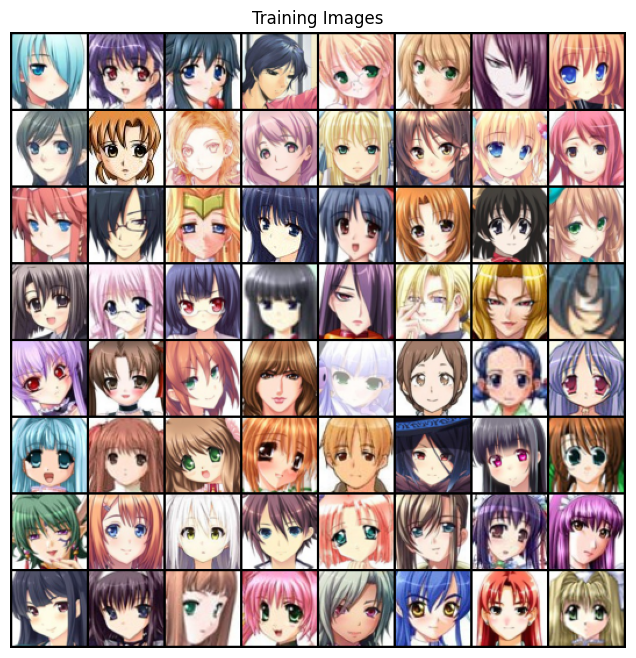

In [9]:
real_batch = next(iter(train_dataloader))

# Display the images
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

In [10]:
latent_dim = 100

In [11]:
class GeneratorLAPGAN(nn.Module):
    def __init__(self, latent_dim):
        super(GeneratorLAPGAN, self).__init__()
        self.latent_dim = latent_dim

        # Initial layer
        self.initial_layer = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True)
        )

        # Resolution 4x4 to 8x8
        self.layer_4_to_8 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True)
        )

        # Resolution 8x8 to 16x16
        self.layer_8_to_16 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True)
        )

        # Resolution 16x16 to 32x32
        self.layer_16_to_32 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True)
        )

        # Resolution 32x32 to 64x64
        self.layer_32_to_64 = nn.Sequential(
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.initial_layer(x)
        x = self.layer_4_to_8(x)
        x = self.layer_8_to_16(x)
        x = self.layer_16_to_32(x)
        x = self.layer_32_to_64(x)
        return x

In [12]:
netG = idist.auto_model(GeneratorLAPGAN(latent_dim))

In [13]:
idist.device()

device(type='cuda')

In [14]:
summary(netG, (latent_dim, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           819,200
|    └─BatchNorm2d: 2-2                  [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
├─Sequential: 1-2                        [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─BatchNorm2d: 2-5                  [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
├─Sequential: 1-3                        [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─BatchNorm2d: 2-8                  [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
├─Sequential: 1-4                        [-1, 64, 32, 32]      

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           819,200
|    └─BatchNorm2d: 2-2                  [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
├─Sequential: 1-2                        [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─BatchNorm2d: 2-5                  [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
├─Sequential: 1-3                        [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─BatchNorm2d: 2-8                  [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
├─Sequential: 1-4                        [-1, 64, 32, 32]      

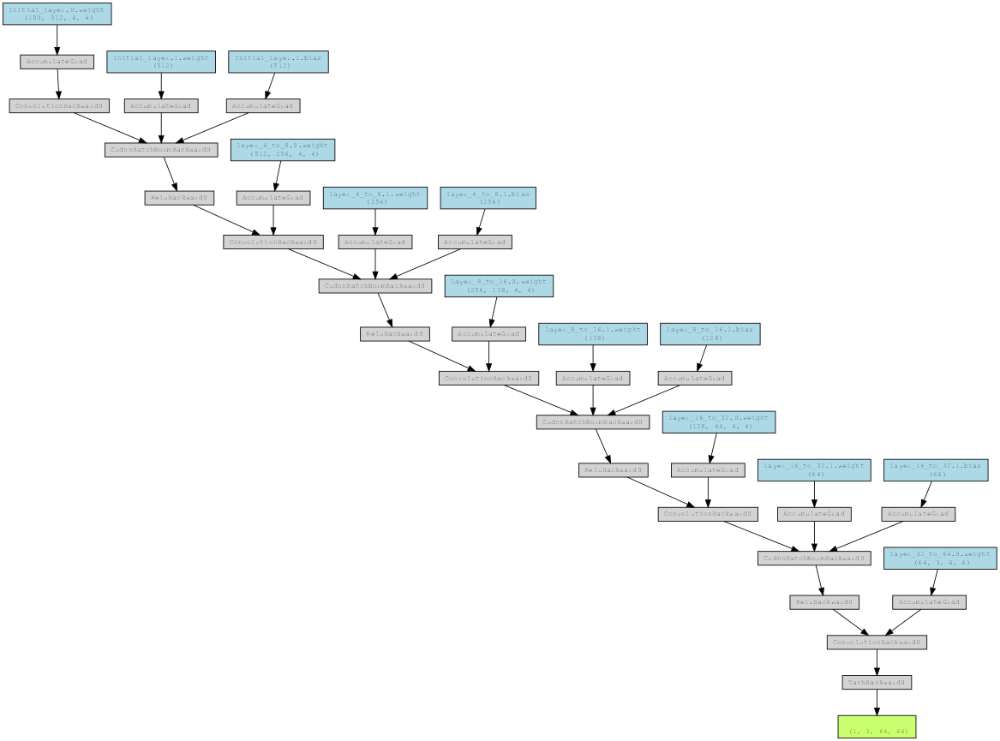

In [43]:
from IPython.display import Image
device = idist.device()
x = torch.randn(1, latent_dim, 1, 1).to(device)

# Generate the model's output to create the graph
y = netG(x)

# Create the visualization
dotG = make_dot(y, params=dict(netG.named_parameters()))

# Save the visualization to a file
dotG.format = 'png'
dotG.render('generator_modellapgan')
Image('generator_modellapgan.png')

### Discriminator

In [16]:
class DiscriminatorLAPGAN(nn.Module):
    def __init__(self):
        super(DiscriminatorLAPGAN, self).__init__()
        self.model = nn.Sequential(
            # input is 3 x 64 x 64
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 64 x 32 x 32
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 128 x 16 x 16
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 256 x 8 x 8
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 512 x 4 x 4
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.model(x)
        return x

In [17]:
netD = idist.auto_model(DiscriminatorLAPGAN())
summary(netD, (3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1, 1, 1]             --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─BatchNorm2d: 2-4                  [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-5                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-6                       [-1, 256, 8, 8]           524,288
|    └─BatchNorm2d: 2-7                  [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-8                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-9                       [-1, 512, 4, 4]           2,097,152
|    └─BatchNorm2d: 2-10                 [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-11                   [-1, 512, 4, 4]           --
|    └─Conv2d: 2-12                      [-1, 1, 1, 1]      

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1, 1, 1]             --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─BatchNorm2d: 2-4                  [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-5                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-6                       [-1, 256, 8, 8]           524,288
|    └─BatchNorm2d: 2-7                  [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-8                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-9                       [-1, 512, 4, 4]           2,097,152
|    └─BatchNorm2d: 2-10                 [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-11                   [-1, 512, 4, 4]           --
|    └─Conv2d: 2-12                      [-1, 1, 1, 1]      

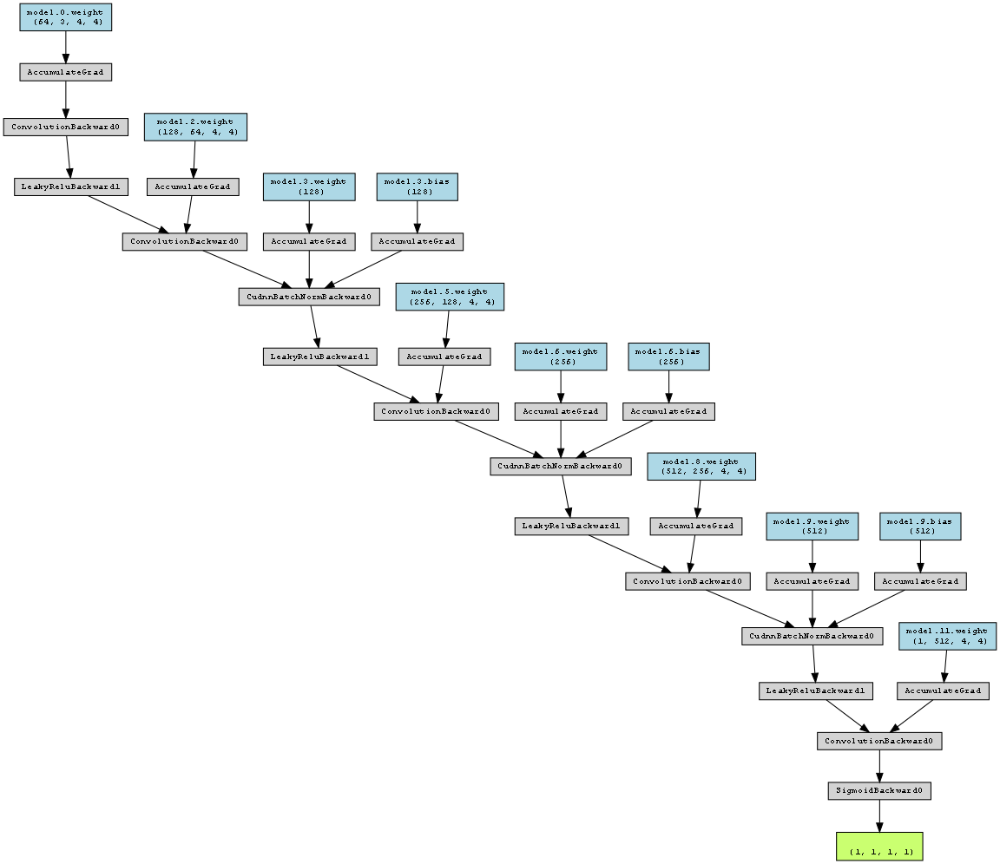

In [18]:
from IPython.display import Image
device = idist.device()
x1 = torch.randn(1, 3, 64, 64).to(device)  # Adjust the size as needed

# Generate the model's output to create the graph
y1 = netD(x1)

# Create the visualization
dotD = make_dot(y1, params=dict(netD.named_parameters()))

# Save the visualization to a file
dotD.format = 'png'
dotD.render('discriminator_modeldcgan')

# Display the image inline
Image('discriminator_modeldcgan.png')

In [19]:
criterion = nn.BCELoss()

In [20]:
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=idist.device())

In [21]:
optimizerD = idist.auto_optim(
    optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
)

optimizerG = idist.auto_optim(
    optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
)

In [22]:
real_label = 1
fake_label = 0


def training_step(engine, data):
    # Set the models for training
    netG.train()
    netD.train()

    ############################
    # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    ## Train with all-real batch
    netD.zero_grad()
    # Format batch
    real = data[0].to(idist.device())
    b_size = real.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=idist.device())
    # Forward pass real batch through D
    output1 = netD(real).view(-1)
    # Calculate loss on all-real batch
    errD_real = criterion(output1, label)
    # Calculate gradients for D in backward pass
    errD_real.backward()

    ## Train with all-fake batch
    # Generate batch of latent vectors
    noise = torch.randn(b_size, latent_dim, 1, 1, device=idist.device())
    # Generate fake image batch with G
    fake = netG(noise)
    label.fill_(fake_label)
    # Classify all fake batch with D
    output2 = netD(fake.detach()).view(-1)
    # Calculate D's loss on the all-fake batch
    errD_fake = criterion(output2, label)
    # Calculate the gradients for this batch, accumulated (summed) with previous gradients
    errD_fake.backward()
    # Compute error of D as sum over the fake and the real batches
    errD = errD_real + errD_fake
    # Update D
    optimizerD.step()

    ############################
    # (2) Update G network: maximize log(D(G(z)))
    ###########################
    netG.zero_grad()
    label.fill_(real_label)  # fake labels are real for generator cost
    # Since we just updated D, perform another forward pass of all-fake batch through D
    output3 = netD(fake).view(-1)
    # Calculate G's loss based on this output
    errG = criterion(output3, label)
    # Calculate gradients for G
    errG.backward()
    # Update G
    optimizerG.step()

    return {
        "Loss_G" : errG.item(),
        "Loss_D" : errD.item(),
        "D_x": output1.mean().item(),
        "D_G_z1": output2.mean().item(),
        "D_G_z2": output3.mean().item(),
    }

In [23]:
trainer = Engine(training_step)

In [24]:
def initialize_fn(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [25]:
@trainer.on(Events.STARTED)
def init_weights():
    netD.apply(initialize_fn)
    netG.apply(initialize_fn)

In [26]:
from ignite.handlers import Timer
timer = Timer(average=True)

@trainer.on(Events.STARTED)
def start_timer(engine):
    timer.reset()


In [27]:
G_losses = []
D_losses = []


@trainer.on(Events.ITERATION_COMPLETED)
def store_losses(engine):
    o = engine.state.output
    G_losses.append(o["Loss_G"])
    D_losses.append(o["Loss_D"])

In [28]:
img_list = []


@trainer.on(Events.ITERATION_COMPLETED(every=500))
def store_images(engine):
    with torch.no_grad():
        fake = netG(fixed_noise).cpu()
    img_list.append(fake)

In [29]:
from ignite.metrics import FID, InceptionScore

In [30]:
fid_metric = FID(device=idist.device())

In [31]:
is_metric = InceptionScore(device=idist.device(), output_transform=lambda x: x[0])

In [32]:
import PIL.Image as Image


def interpolate(batch):
    arr = []
    for img in batch:
        pil_img = transforms.ToPILImage()(img)
        resized_img = pil_img.resize((299,299), Image.BILINEAR)
        arr.append(transforms.ToTensor()(resized_img))
    return torch.stack(arr)


def evaluation_step(engine, batch):
    with torch.no_grad():
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=idist.device())
        netG.eval()
        fake_batch = netG(noise)
        fake = interpolate(fake_batch)
        real = interpolate(batch[0])
        return fake, real

In [33]:
evaluator = Engine(evaluation_step)
fid_metric.attach(evaluator, "fid")
is_metric.attach(evaluator, "is")

In [34]:
fid_values = []
is_values = []


@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(engine):

    evaluator.run(test_dataloader,max_epochs=1)
    metrics = evaluator.state.metrics
    fid_score = metrics['fid']
    is_score = metrics['is']
    fid_values.append(fid_score)
    is_values.append(is_score)
    print(f"Epoch [{engine.state.epoch}/20] Metric Scores")
    print(f"*   FID : {fid_score:4f}")
    print(f"*    IS : {is_score:4f}")
    print(f"Epoch {engine.state.epoch} completed in {timer.value():.2f} seconds")


In [35]:
from ignite.metrics import RunningAverage


RunningAverage(output_transform=lambda x: x["Loss_G"]).attach(trainer, 'Loss_G')
RunningAverage(output_transform=lambda x: x["Loss_D"]).attach(trainer, 'Loss_D')

In [36]:
from ignite.contrib.handlers import ProgressBar


ProgressBar().attach(trainer, metric_names=['Loss_G','Loss_D'])
ProgressBar().attach(evaluator)

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\ignite\handlers\tqdm_logger.py:127: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [37]:
def training(*args):
    trainer.run(train_dataloader, max_epochs=20)

In [38]:
with idist.Parallel(backend='gloo') as parallel:
    parallel.run(training)

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\torch\autograd\graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [1/20] Metric Scores
*   FID : 0.080709
*    IS : 1.274630
Epoch 1 completed in 378.10 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [2/20] Metric Scores
*   FID : 0.066339
*    IS : 1.315232
Epoch 2 completed in 559.75 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [3/20] Metric Scores
*   FID : 0.075848
*    IS : 1.627445
Epoch 3 completed in 734.54 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [4/20] Metric Scores
*   FID : 0.052960
*    IS : 1.704148
Epoch 4 completed in 917.81 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [5/20] Metric Scores
*   FID : 0.065623
*    IS : 1.831616
Epoch 5 completed in 1091.45 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [6/20] Metric Scores
*   FID : 0.042912
*    IS : 1.757149
Epoch 6 completed in 1266.59 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [7/20] Metric Scores
*   FID : 0.043329
*    IS : 1.876009
Epoch 7 completed in 1441.83 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [8/20] Metric Scores
*   FID : 0.030694
*    IS : 1.742793
Epoch 8 completed in 1618.41 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [9/20] Metric Scores
*   FID : 0.049794
*    IS : 1.852480
Epoch 9 completed in 1800.25 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [10/20] Metric Scores
*   FID : 0.035904
*    IS : 1.869882
Epoch 10 completed in 1980.22 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [11/20] Metric Scores
*   FID : 0.032051
*    IS : 1.914972
Epoch 11 completed in 2151.87 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [12/20] Metric Scores
*   FID : 0.034124
*    IS : 1.969983
Epoch 12 completed in 2323.28 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [13/20] Metric Scores
*   FID : 0.033075
*    IS : 1.882077
Epoch 13 completed in 2493.96 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [14/20] Metric Scores
*   FID : 0.027900
*    IS : 1.846299
Epoch 14 completed in 2666.64 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [15/20] Metric Scores
*   FID : 0.027282
*    IS : 1.933682
Epoch 15 completed in 2837.38 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [16/20] Metric Scores
*   FID : 0.031369
*    IS : 1.884503
Epoch 16 completed in 3008.38 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [17/20] Metric Scores
*   FID : 0.026251
*    IS : 1.996615
Epoch 17 completed in 3180.53 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [18/20] Metric Scores
*   FID : 0.030918
*    IS : 1.959186
Epoch 18 completed in 3352.20 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [19/20] Metric Scores
*   FID : 0.022535
*    IS : 1.891782
Epoch 19 completed in 3524.25 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [20/20] Metric Scores
*   FID : 0.033347
*    IS : 1.911051
Epoch 20 completed in 3694.75 seconds


## Inference

Finally, let's check out the results. First, how the discriminator's and generator’s losses changed during training. Second, the `FID` and `IS` performance improvments of the model. And last, look a batch of real data next to a batch of fake data from the generator.

**Losses versus training iterations**

Below is a plot of the discriminator's and generator’s losses versus training iterations.

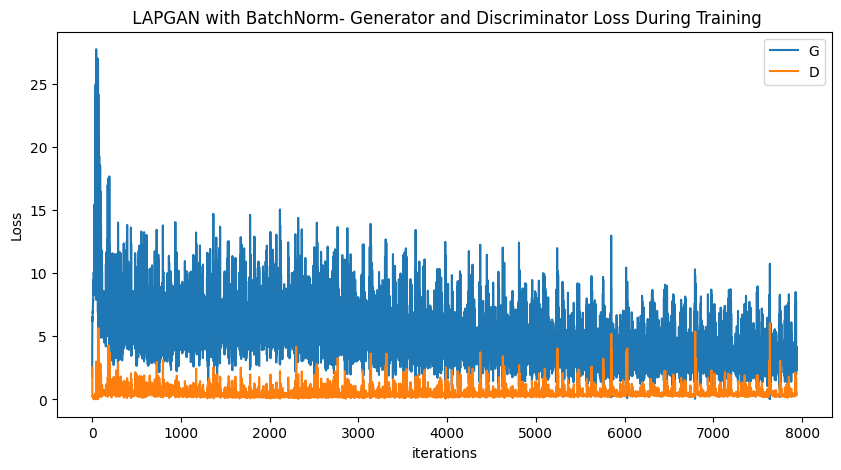

In [42]:
%matplotlib inline

plt.figure(figsize=(10,5))
plt.title(" LAPGAN with BatchNorm- Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()

**Evaluation Metric versus training iterations**

Below is a plot of Evaluation versus training iterations.
As we can see `IS` increases sharply at first indicating the generator model is learning quickly how to generate faces. Unlike `IS`, `FID` is decreasing sharply at first similarly indicating the learning process of the generator model. 

Note: Higher value of `FID` implies better results and lower value of `IS` implies better results.

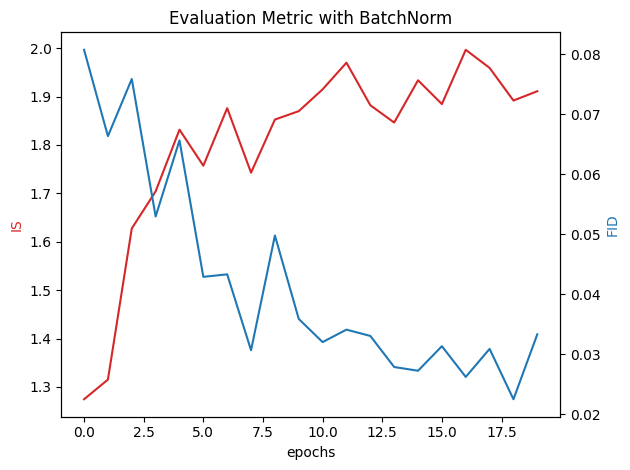

In [40]:
fig, ax1 = plt.subplots()

plt.title("Evaluation Metric with BatchNorm")

color = 'tab:red'
ax1.set_xlabel('epochs')
ax1.set_ylabel('IS', color=color)
ax1.plot(is_values, color=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('FID', color=color)
ax2.plot(fid_values, color=color)

fig.tight_layout()

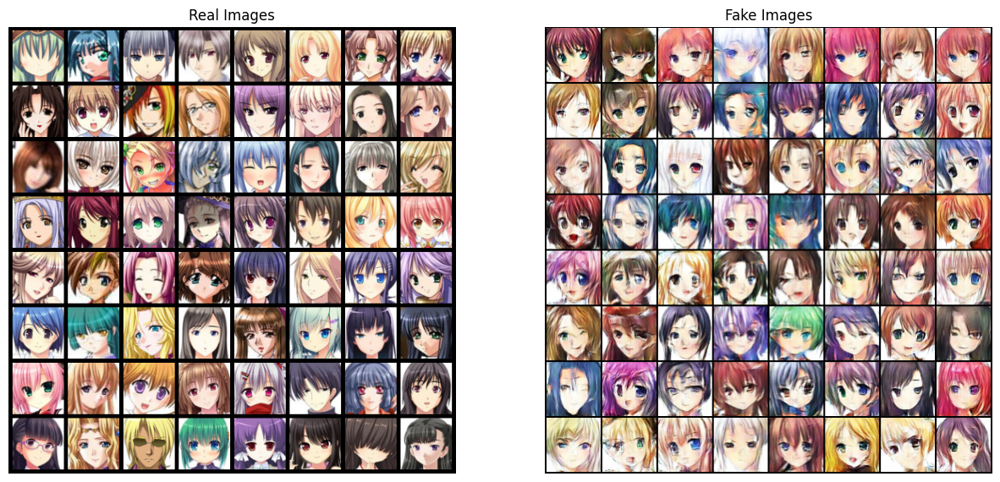

In [41]:
%matplotlib inline

# Grab a batch of real images from the dataloader
real_batch = next(iter(train_dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(vutils.make_grid(img_list[-1], padding=2, normalize=True).cpu(),(1,2,0)))